## Nicolas A Gort Freitas
# Location Based Assignment: Hyderabad
## CS156 Machine Learning

In the following paper I will perform a factor analysis of a series of 22 pictures taken between  
3 PM and 7:30 PM from the office of T-Hub, a startup accelerator in Hyderabad, India. These photos  
were intended to be almost identical, aside from the obvious change in light. I will thus analyze  
how PCA captures the variation among the images over time and attempt to describe what each individual  
PCA is related graphically to.

### Dependencies

In [339]:
import glob
import numpy as np
import matplotlib.pyplot as plt
import datetime

from glob import glob
from PIL import Image
from scipy.misc import imread,imresize

from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize, minmax_scale

from itertools import chain, product

### Function bank

In [420]:
def flat_to_rgb(flt,size):
    flatrgb = flt.reshape(size[0]*size[1],3)
    prergb = np.array([tuple([int(j) for j in i]) for i in flatrgb])
    rgb = minmax_scale(prergb).reshape(size[1],size[0],3)
    
    return rgb

def img_to_array(filename,size, flat=True):
    img = Image.open(filename)
    img = img.resize(size)
    if flat:
        return np.array(img).reshape(1,-1)
    else:
        return np.array(img)

### Data paths and metadata

In [138]:
photos_paths = glob("office_window/*")
photos_paths.sort()

datetimes_taken = [Image.open(photo)._getexif()[36867] for photo in photos_paths]
datetimes_parsed = [datetime.datetime.strptime(date, '%Y:%m:%d %H:%M:%S') for date in dates_taken]
datetimes_parsed = [(dt + datetime.timedelta(hours=4)) for dt in  datetimes_parsed] # wrong timezone in camera

In [197]:
photos_arrays = [img_to_array(photo, size, flat=False) for photo in photos_paths]

In [46]:
size = (512,512) 
photos_flat = [img_to_array(photo, size) for photo in photos_paths]
photos_flat = np.array(photos_flat).reshape(len(photos_paths),np.prod(size)*3)


### Original photos

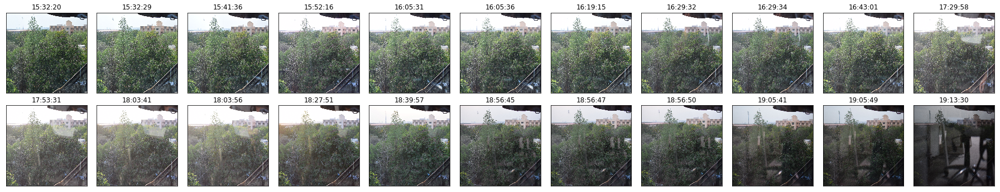

In [410]:
fig, axes = plt.subplots(2,11,figsize=(25,5))

for i,ax in enumerate(axes.flatten()):
    ax.imshow(photos_flat[i].reshape(size[0],size[1],3))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(datetimes_parsed[i].time())

plt.tight_layout()
plt.subplots_adjust(hspace=0.02)
plt.show()


### Dimensionality reduction (2 principal components)

In [76]:
pca = PCA(n_components=2)
pca.fit(photos_flat)
photos_2d = pca.transform(photos_flat)

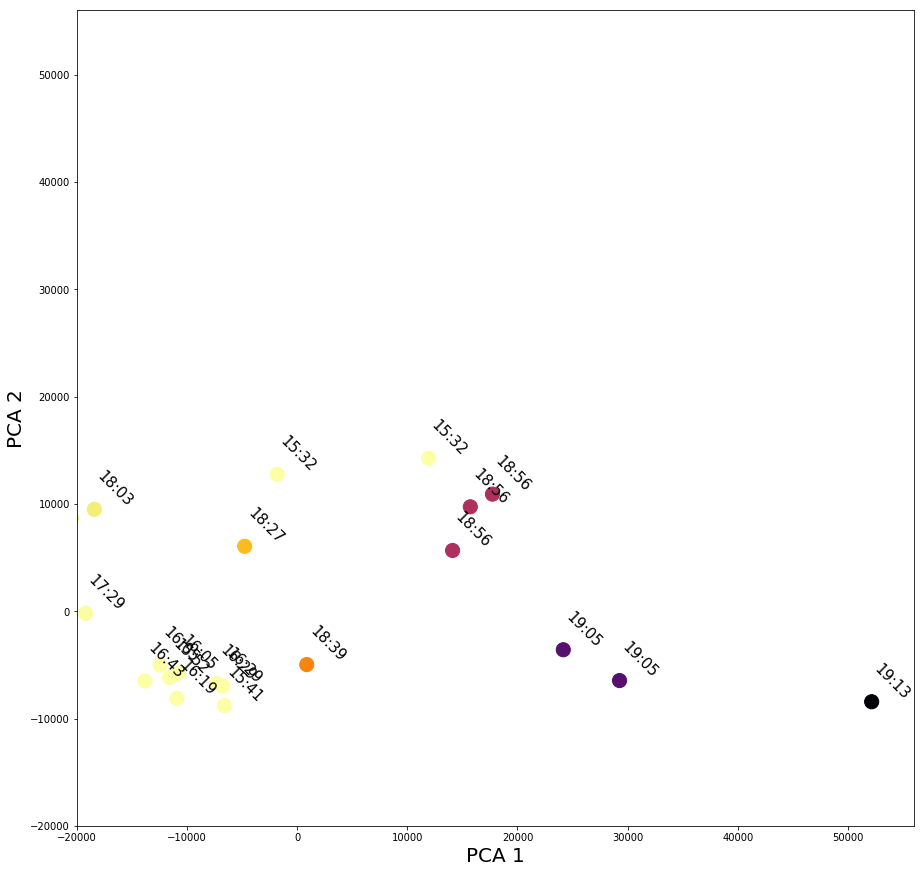

In [582]:
date_colors = minmax_scale([(dt - datetime.datetime(2018,4,13,15,0,0,0)).total_seconds() for dt in datetimes_parsed])**8


plt.figure(figsize=(15,15))
plt.scatter(photos_2d[:,0],photos_2d[:,1], s=200, c = date_colors, cmap='inferno_r')
plt.xlim(-2e4,5.6e4)
plt.ylim(-2e4,5.6e4)
plt.xlabel('PCA 1', fontsize=20)
plt.ylabel('PCA 2', fontsize=20)


for label,x,y in zip([str(dt.hour)+':'+'%02d'%(dt.minute) for dt in datetimes_parsed], photos_2d[:,0], photos_2d[:,1]):
    plt.annotate(str(label),xy=(x,y), clip_on=True, rotation=-45, 
                 horizontalalignment='left', verticalalignment='bottom',
                size=15)

plt.show()

### Reconstructions

In [193]:
photos_reconstructed = [flat_to_rgb(pca.inverse_transform(photo),size) for photo in photos_2d]

/Users/nico/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64.
  warnings.warn(msg, DataConversionWarning)


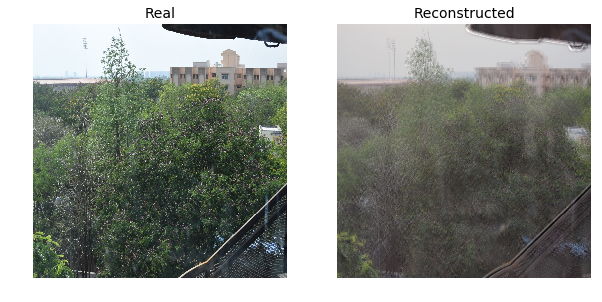

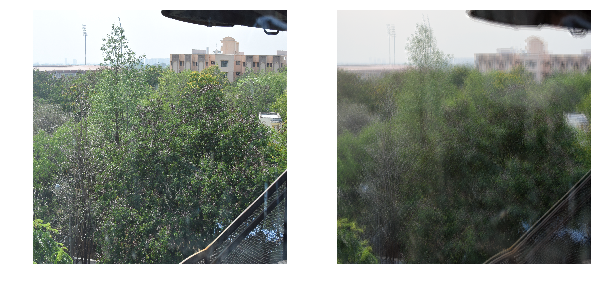

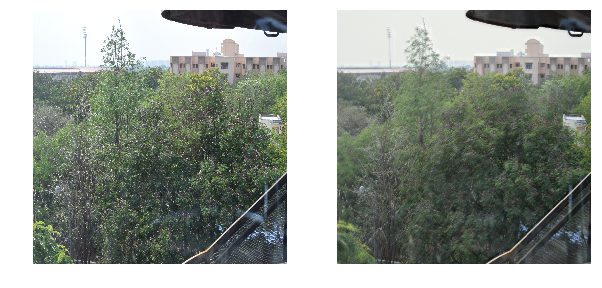

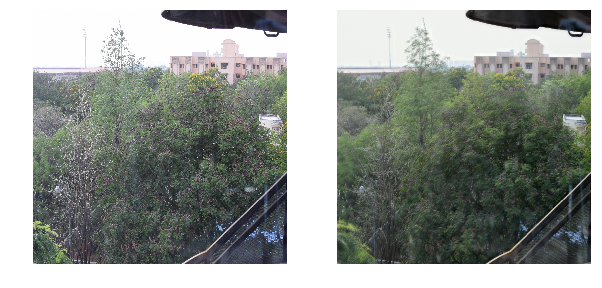

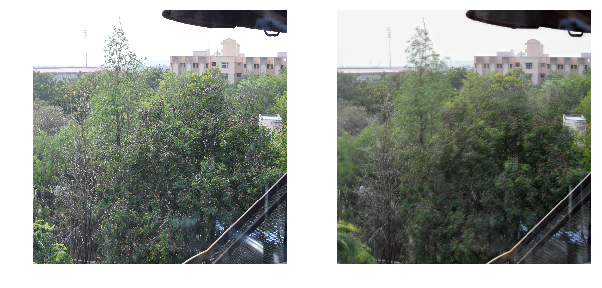

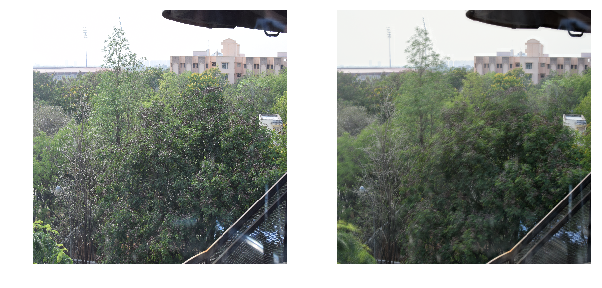

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


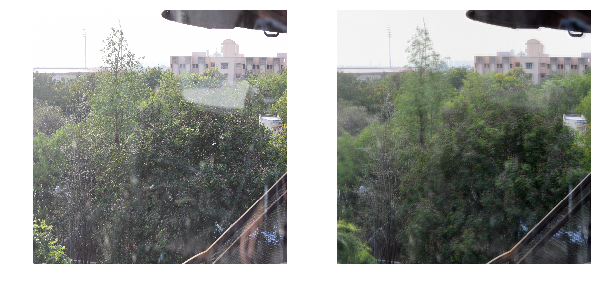

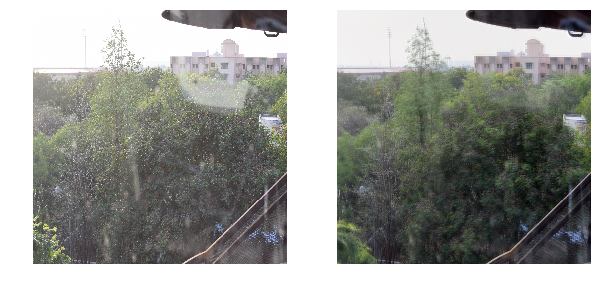

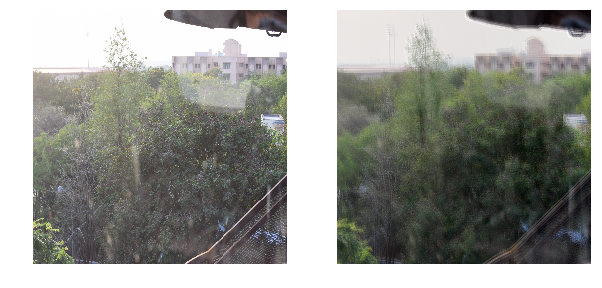

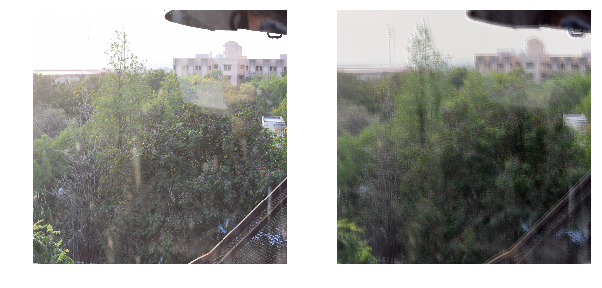

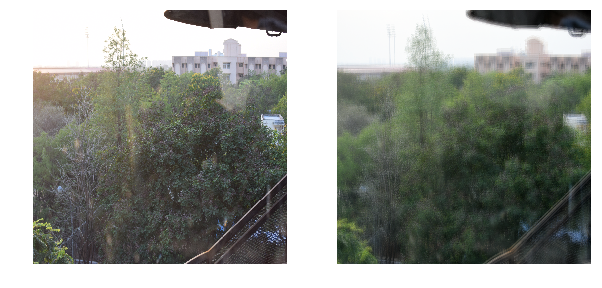

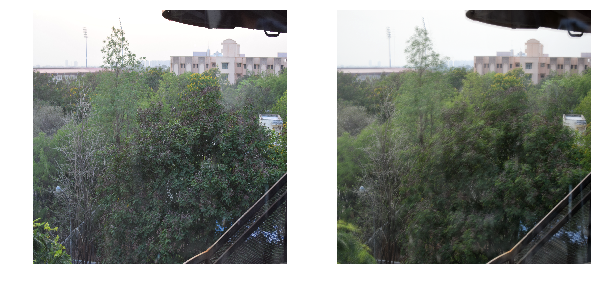

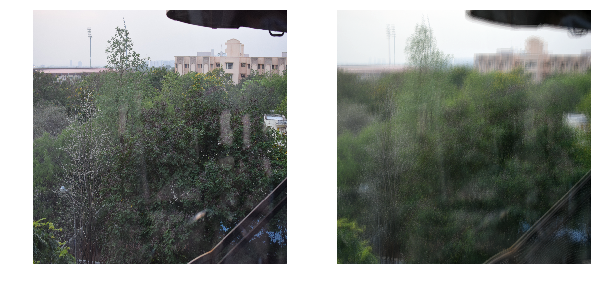

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


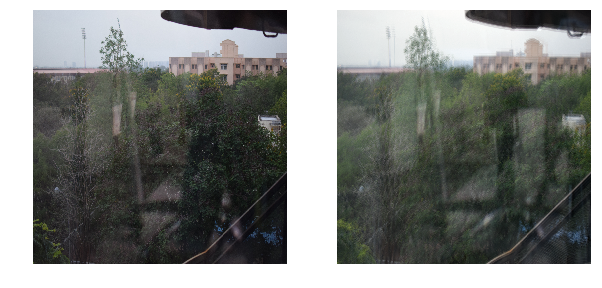

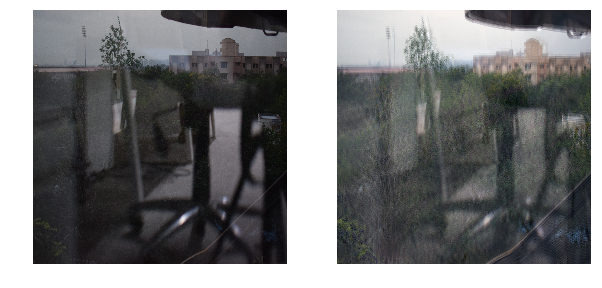

In [267]:
photos_compare = list(chain(*zip(photos_arrays, photos_reconstructed)))

for i in range(22):
    fig, axes = plt.subplots(1,2, figsize = (10,5))
    axes[0].axis('off') 
    axes[1].axis('off')
    axes[0].imshow(photos_compare[2*i    ])
    axes[1].imshow(photos_compare[2*i + 1])
    
    if i == 0:
        axes[0].set_title('Real', fontsize=14)
        axes[1].set_title('Reconstructed', fontsize=14)    
    plt.show()

### What are the principal components capturing?

		Synthetic images reconstructed from PCA values within CI95


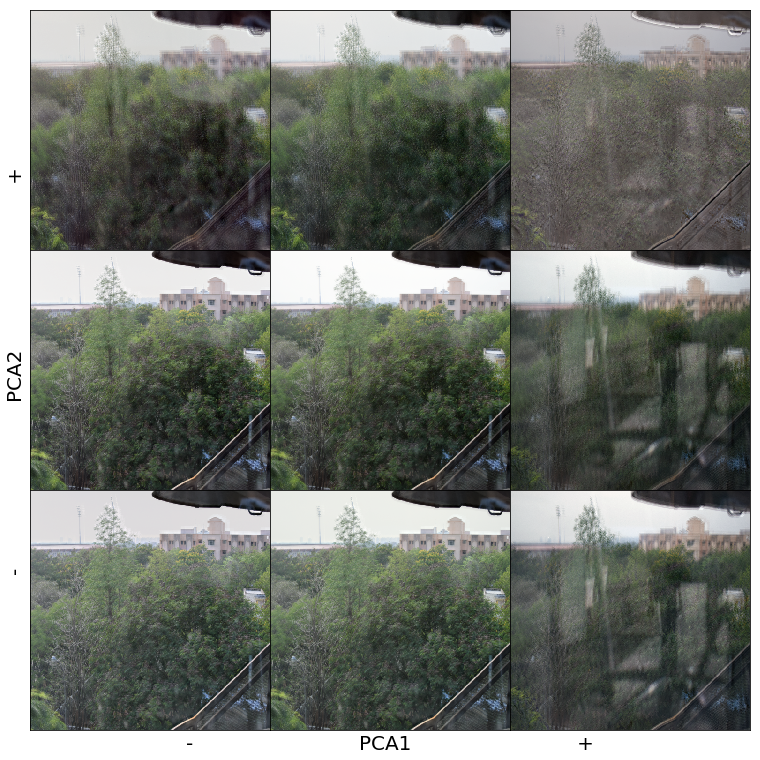

In [622]:
# ci95_pca1 = np.percentile(photos_2d[:,0],[2.5,50,97.5])
# ci95_pca2 = np.percentile(photos_2d[:,1],[97.5,50,2.5])

# coords = [(y,x) for x,y in product(ci95_pca2, ci95_pca1)]
# reconstructed = [flat_to_rgb(pca.inverse_transform(pair),size) for pair in coords]

fig, axes = plt.subplots(3,3,figsize=(50,50))

for i,ax in enumerate(axes.flatten()):
    ax.imshow(reconstructed[i])
    
    ax.set_xticks([])
    ax.set_yticks([])
    
    if i==7:
        ax.set_xlabel('-                          PCA1                          +', fontsize=20)
    elif i==3:
        ax.set_ylabel('-                          PCA2                          +', fontsize=20)

print('\t\tSynthetic images reconstructed from PCA values within CI95',)
plt.subplots_adjust(hspace=0,wspace=0, left=0.6, right=0.8, bottom=0.8, top=1)
plt.show()
    

### Hypothesis

As suggested visually, PCA1 represents the strength of the reflection of the window in the image  
and PCA2 captured the slight changes in position of the camera and the trees being blown by the  
wind. To test thes hypotheses, I will analyze how these components evolved over time on each  
photo. If true, I would expect PCA1 to increase over time, especially after the sunset, which  
is when the interior light of the office outweighs the sunlight and makes the glass reflect  
the interior of the office. I would expect PCA2 to remain constant or increase only slightly, as  
I assume wind remained constant and I attribute most movement of the camera to my own touch.

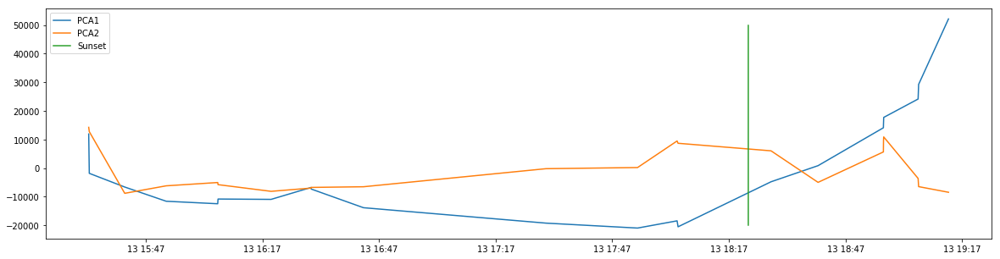

In [403]:
plt.figure(figsize=(20,5))
plt.plot(datetimes_parsed,photos_2d[:,0], label='PCA1')
plt.plot(datetimes_parsed,photos_2d[:,1], label='PCA2')
plt.plot(2*[datetime.datetime(2018,4,13,18,22,0)],[-2e4,5e4], label='Sunset')
plt.legend()
plt.show()

The data supports my hypothesis. An alternative explanation would be that PCA1 simply represents  
the level of darkness in the photo. However, I believe that darkness is not represented in either  
of the first two PCs because the reconstruction of the last picture, taken over an hour after sunset,  
had a similar lightening level to most other reconstructions while conserving the reflection of the  
window, suggesting that it is the reflection and not the light what produces most graphical variation.

### Appendix: Testing extreme values (2 ranges beyond extremes)

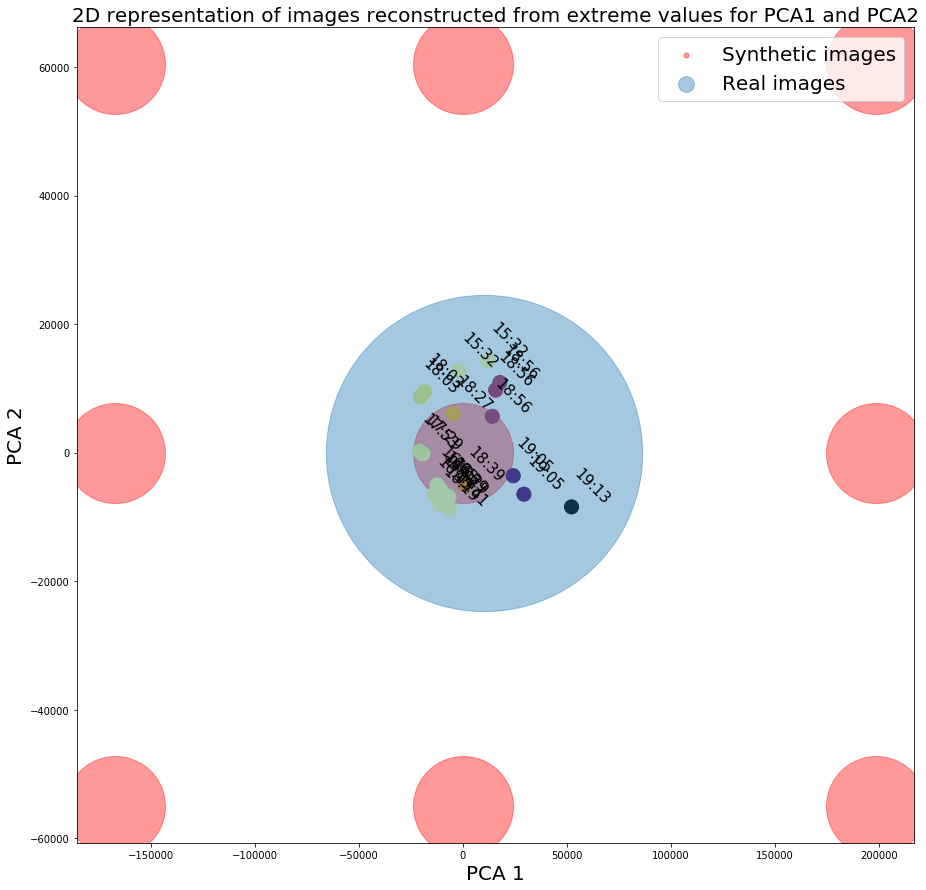

In [617]:
extremes_pca1 = [np.min(photos_2d[:,0]) - 2*np.ptp(photos_2d[:,0]), 
             np.mean(photos_2d[:,0]),
             np.max(photos_2d[:,0]) + 2*np.ptp(photos_2d[:,0])]
                 
extremes_pca2 = [np.min(photos_2d[:,1]) - 2*np.ptp(photos_2d[:,1]), 
             np.mean(photos_2d[:,1]),
             np.max(photos_2d[:,1]) + 2*np.ptp(photos_2d[:,1])]

coords_extremes = np.array([(y,x) for x,y in product(extremes_pca2, extremes_pca1)])


date_colors = minmax_scale([(dt - datetime.datetime(2018,4,13,15,0,0,0)).total_seconds() for dt in datetimes_parsed])**8


plt.figure(figsize=(15,15))
plt.scatter(coords_extremes[:,0], coords_extremes[:,1], label='Synthetic images', color='r', s=1e4, alpha=.4)
plt.scatter(photos_2d[:,0],photos_2d[:,1], s=200, c = date_colors, cmap='inferno_r')
plt.scatter([1e4],[0], s=1e5, alpha=0.4, label='Real images')
#plt.xlim(-2e4,5.6e4)
#plt.ylim(-2e4,5.6e4)
plt.xlabel('PCA 1', fontsize=20)
plt.ylabel('PCA 2', fontsize=20)


for label,x,y in zip([str(dt.hour)+':'+'%02d'%(dt.minute) for dt in datetimes_parsed], photos_2d[:,0], photos_2d[:,1]):
    plt.annotate(str(label),xy=(x,y), clip_on=True, rotation=-45, 
                 horizontalalignment='left', verticalalignment='bottom',
                size=15)

plt.title('2D representation of images reconstructed from extreme values for PCA1 and PCA2', fontsize=20)
plt.legend(markerscale=0.05, fontsize=20)
plt.show()

/Users/nico/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64.
  warnings.warn(msg, DataConversionWarning)


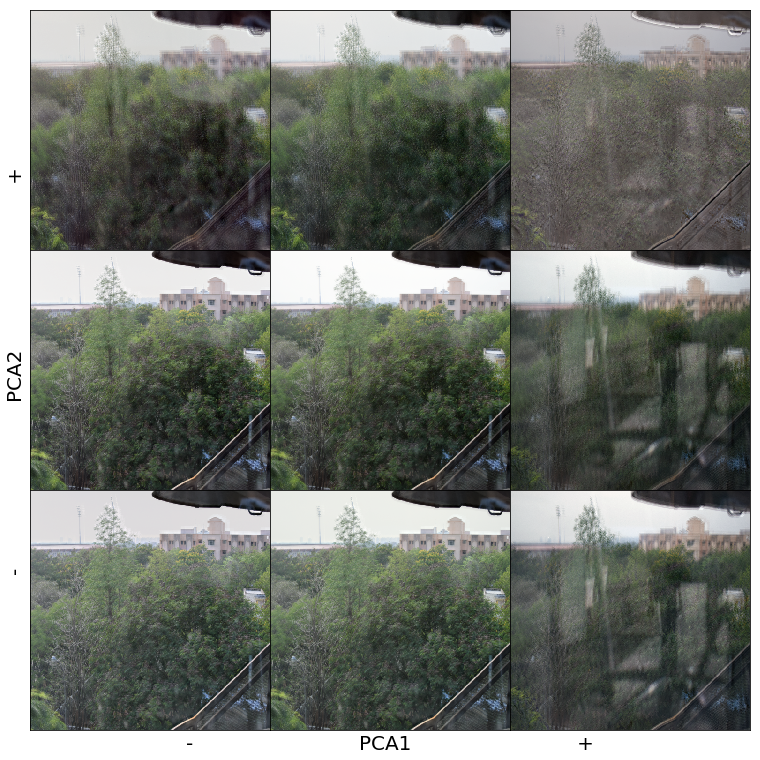

In [408]:
coords_extremes = [(y,x) for x,y in product(extremes_pca2, extremes_pca1)]
reconstructed_extremes = [flat_to_rgb(pca.inverse_transform(pair),size) for pair in coords]

fig, axes = plt.subplots(3,3,figsize=(50,50))

for i,ax in enumerate(axes.flatten()):
    ax.imshow(reconstructed_extremes[i])
    
    ax.set_xticks([])
    ax.set_yticks([])
    
    if i==7:
        ax.set_xlabel('-                          PCA1                          +', fontsize=20)
    elif i==3:
        ax.set_ylabel('-                          PCA2                          +', fontsize=20)

#plt.tight_layout()
plt.subplots_adjust(hspace=0,wspace=0, left=0.6, right=0.8, bottom=0.8, top=1)
plt.show()
    